# Multi Asset Price Evaluation using Multi-Processing 

In this project, we deal with multiple stock options and evaluate the stocks simultaneously. While the data we use is of the past 24 years each, the collective data becomes huge and requires methodologies to make the computational work faster. As a result, we resort to multi-processing. 

Multiprocessing enables multiple computational work to occur simulataneously by allowing us to access multiple CPU cores. This has huge impacts in the scenarios where we deal with real time incoming data and thus, time lag between the reception of data and its processing needs to be optimized. 

The data is obtained from the YaHoo finance library in python, which gives us access to multiple stock data. Various other measures of evaluating the stock movements like : RSI, EMA50 and Price Range of the stock were put into use. 

## Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import yfinance as yf
import plotly.graph_objects as go

In [3]:
import ta

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [5]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.callbacks import EarlyStopping

In [6]:
!pip install scikeras

Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_learn-1.5.1-cp311-cp311-win_amd64.whl.metadata (12 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
Using cached scikit_learn-1.5.1-cp311-cp311-win_amd64.whl (11.0 MB)
Using cached threadpoolctl-3.5.0-py3-none-any.whl (18 kB)


In [6]:
from multiprocessing import Pool, cpu_count
from scikeras.wrappers import KerasRegressor
from concurrent.futures import ProcessPoolExecutor

## Gathering Data

In [7]:
def download_data(ticker, start, end):
    data = {}
    for tk in ticker:
        data[tk] = yf.download(tk,start,end)
    return data

In [8]:
tickers = ['JPM', 'BAC', 'ACN', 'NVDA']
start_train = '2000-01-01'
end_train = '2024-01-01'

In [10]:
start_test = '2024-01-01'
end_test = '2024-08-13'

In [11]:
data_train = download_data(tickers, start_train, end_train)
data_test = download_data(tickers, start_test, end_test)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [12]:
data_train

{'JPM':                   Open        High         Low       Close   Adj Close  \
 Date                                                                     
 2000-01-03   49.833332   50.250000   48.083332   48.583332   23.645033   
 2000-01-04   47.083332   47.458332   46.125000   47.250000   23.126221   
 2000-01-05   46.833332   48.375000   46.000000   46.958332   22.983475   
 2000-01-06   46.750000   48.625000   46.500000   47.625000   23.309772   
 2000-01-07   48.416668   49.000000   47.333332   48.500000   23.738024   
 ...                ...         ...         ...         ...         ...   
 2023-12-22  167.500000  168.229996  167.229996  167.399994  164.497711   
 2023-12-26  167.460007  168.770004  167.179993  168.389999  165.470566   
 2023-12-27  167.839996  169.470001  167.580002  169.399994  166.463043   
 2023-12-28  169.350006  170.660004  169.000000  170.300003  167.347458   
 2023-12-29  170.000000  170.690002  169.630005  170.100006  167.150940   
 
               V

## Data Preprocessing and Evaluation

In [13]:
jpm_data = data_train['JPM']
bac_data = data_train['BAC']
acn_data = data_train['ACN']
nvda_data = data_train['NVDA']

In [14]:
jpm_data['Date'] = jpm_data.index

In [15]:
jpm_data = jpm_data.reset_index(drop = True)

In [16]:
data = [bac_data, acn_data, nvda_data]

for i in data:
    i['Date'] = i.index
    i = i.reset_index(drop = True)

In [17]:
bac_data = bac_data.reset_index(drop = True)
acn_data = acn_data.reset_index(drop = True)
nvda_data = nvda_data.reset_index(drop = True)

## Basic Statistical Inferences

In [18]:
data = [jpm_data, bac_data, acn_data, nvda_data]
data_name = ['JP Morgan & Chase Stock Prices', 'Bank Of America Stock Prices', 'Accenture Plc Stock Prices', 'NVDIA Stock Prices']

for i,j in zip(data, data_name):
    print("--------------------------------------------------------------")
    print("--------------------------------------------------------------")
    print(f"Basic Statistical Information on {j}")
    print("--------------------------------------------------------------")
    print(i.describe())

--------------------------------------------------------------
--------------------------------------------------------------
Basic Statistical Information on JP Morgan & Chase Stock Prices
--------------------------------------------------------------
              Open         High          Low        Close    Adj Close  \
count  6037.000000  6037.000000  6037.000000  6037.000000  6037.000000   
mean     66.803264    67.533768    66.062420    66.805213    52.609650   
min      15.370000    16.350000    14.960000    15.450000     8.349788   
25%      38.980000    39.500000    38.410000    38.959999    23.844320   
50%      48.630001    49.180000    48.041668    48.625000    30.964237   
75%      95.199997    96.839996    94.190002    95.500000    81.440269   
max     172.710007   172.960007   170.539993   171.779999   167.347458   
std      38.488651    38.765005    38.227372    38.496688    39.887001   

             Volume                           Date  
count  6.037000e+03        

In [19]:
print(bac_data.isnull().sum())
print("---------------------")
print(acn_data.isnull().sum())
print("---------------------")
print(nvda_data.isnull().sum())
print("---------------------")
print(jpm_data.isnull().sum())

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Date         0
dtype: int64
---------------------
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Date         0
dtype: int64
---------------------
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Date         0
dtype: int64
---------------------
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Date         0
dtype: int64


In [146]:
#no null values available 

## Data Visualisation

In [20]:
stock_name = ['JP Morgan & Chase', 'Bank of America Cooperation', 'Accenture PLS', 'NVIDIA']

In [21]:
import warnings
warnings.simplefilter('ignore')

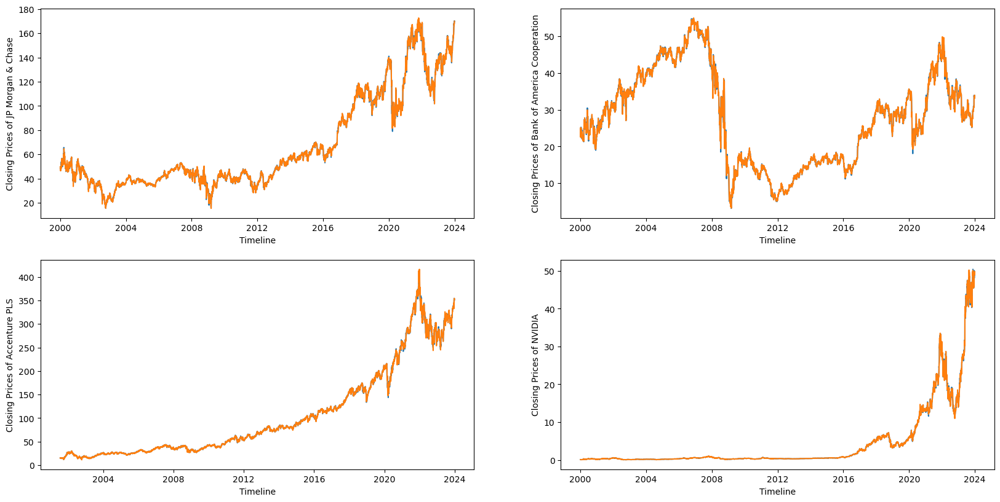

In [22]:
plt.figure(figsize=(20, 150))
plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]
palette = sns.color_palette("mako_r", 6)

for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.lineplot(data = i, x = 'Date', y = 'Close', palette = palette)
    sns.lineplot(data = i, x = 'Date', y = 'Open', palette = palette)
    plt.ylabel(f"Closing Prices of {j}")
    plt.xlabel("Timeline")

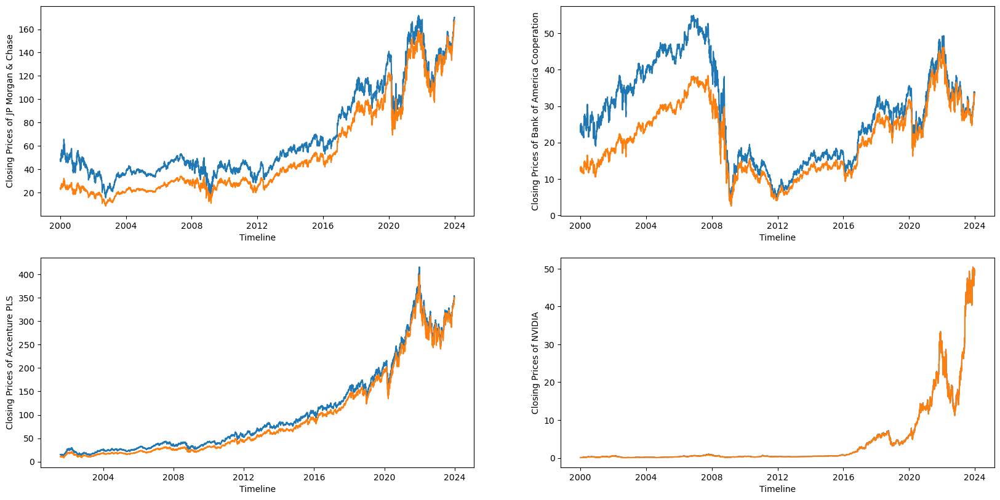

In [23]:
plt.figure(figsize=(20, 150))
plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]
palette = sns.color_palette("crest", 6)

for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.lineplot(data = i, x = 'Date', y = 'Close', palette = palette)
    sns.lineplot(data = i, x = 'Date', y = 'Adj Close', palette = palette)
    plt.ylabel(f"Closing Prices of {j}")
    plt.xlabel("Timeline")

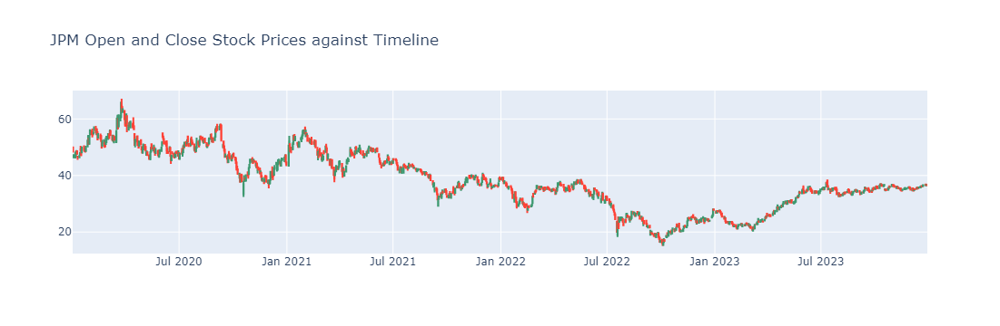

<Figure size 2000x3000 with 0 Axes>

In [24]:
plt.figure(figsize = (20,30))
fig = go.Figure(data=[go.Candlestick(x=jpm_data['Date'][jpm_data['Date'] > '2020-01-01'],
                open=jpm_data['Open'],
                high=jpm_data['High'],
                low=jpm_data['Low'],
                close=jpm_data['Close'])])
fig.update_layout(xaxis_rangeslider_visible=False, title = "JPM Open and Close Stock Prices against Timeline")
fig.show()

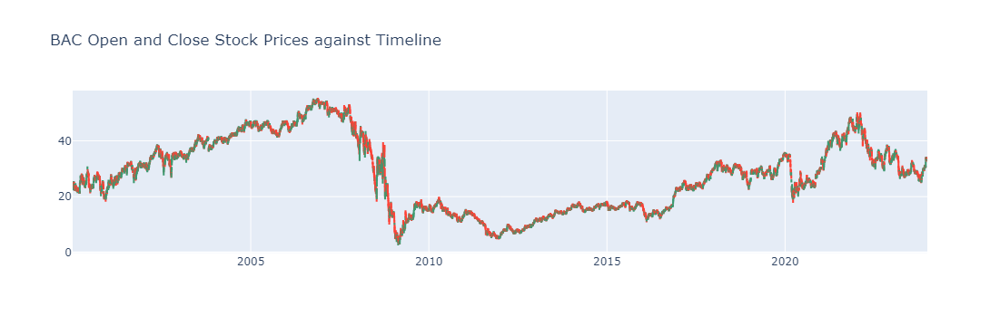

<Figure size 2000x3000 with 0 Axes>

In [25]:
plt.figure(figsize = (20,30))
fig = go.Figure(data=[go.Candlestick(x=bac_data['Date'],
                open=bac_data['Open'],
                high=bac_data['High'],
                low=bac_data['Low'],
                close=bac_data['Close'])])
fig.update_layout(xaxis_rangeslider_visible=False, title = "BAC Open and Close Stock Prices against Timeline")
fig.show()

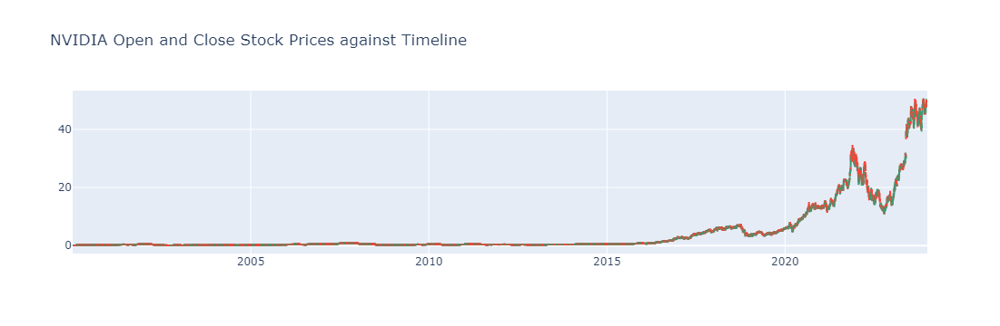

<Figure size 2000x3000 with 0 Axes>

In [26]:
plt.figure(figsize = (20,30))
fig = go.Figure(data=[go.Candlestick(x=nvda_data['Date'],
                open=nvda_data['Open'],
                high=nvda_data['High'],
                low=nvda_data['Low'],
                close=nvda_data['Close'])])
fig.update_layout(xaxis_rangeslider_visible=False, title = "NVIDIA Open and Close Stock Prices against Timeline")
fig.show()

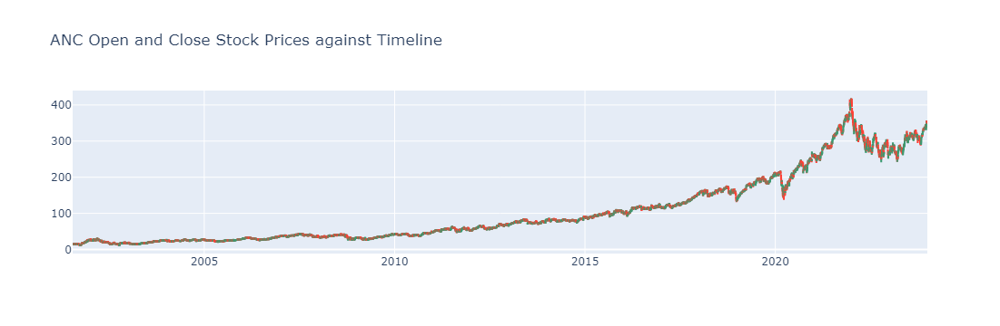

<Figure size 2000x3000 with 0 Axes>

In [27]:
plt.figure(figsize = (20,30))
fig = go.Figure(data=[go.Candlestick(x=acn_data['Date'],
                open=acn_data['Open'],
                high=acn_data['High'],
                low=acn_data['Low'],
                close=acn_data['Close'])])
fig.update_layout(xaxis_rangeslider_visible=False, title = "ANC Open and Close Stock Prices against Timeline")
fig.show()

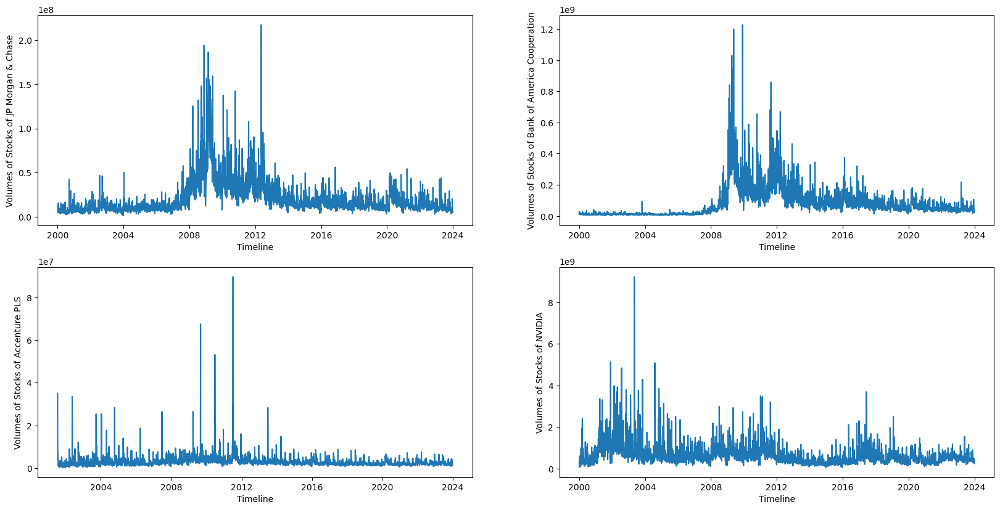

In [28]:
#analysing volume of data 
plt.figure(figsize=(20, 150))
plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]
palette = sns.color_palette("rocket", 6)

for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.lineplot(data = i, x = 'Date', y = 'Volume', palette = palette)
    plt.ylabel(f"Volumes of Stocks of {j}")
    plt.xlabel("Timeline")

## Adding Some Evaluation Parameters

#### Daily Return and Price Range

In [29]:
jpm_data['Daily Return'] = jpm_data['Close'].pct_change()
bac_data['Daily Return'] = bac_data['Close'].pct_change()
acn_data['Daily Return'] = acn_data['Close'].pct_change()
nvda_data['Daily Return'] = nvda_data['Close'].pct_change()

In [30]:
jpm_data['Price Range'] = jpm_data['High'] - jpm_data['Low']
bac_data['Price Range'] = bac_data['High'] - bac_data['Low']
acn_data['Price Range'] = acn_data['High'] - acn_data['Low']
nvda_data['Price Range'] = nvda_data['High'] - nvda_data['Low']

#### Exponential Moving Average

In [31]:
jpm_data['EMA_50'] = jpm_data['Close'].ewm(span=50, adjust=False).mean()
bac_data['EMA_50'] = bac_data['Close'].ewm(span=50, adjust=False).mean()  
acn_data['EMA_50'] = acn_data['Close'].ewm(span=50, adjust=False).mean()  
nvda_data['EMA_50'] = nvda_data['Close'].ewm(span=50, adjust=False).mean()  

#### Relative Strength Index

In [32]:
jpm_data['RSI'] = ta.momentum.RSIIndicator(jpm_data['Close']).rsi()
bac_data['RSI'] = ta.momentum.RSIIndicator(bac_data['Close']).rsi()
acn_data['RSI'] = ta.momentum.RSIIndicator(acn_data['Close']).rsi()
nvda_data['RSI'] = ta.momentum.RSIIndicator(nvda_data['Close']).rsi()

## Analysing the Parameters

In [33]:
data = [jpm_data, bac_data, acn_data, nvda_data]

In [38]:
for i, j in zip(data, stock_name):
    print("----------------------------------------------------------")
    print(f"Drawing Inference from Daily Returns of {j} Stock Data")
    print(i['Daily Return'].describe())
    print("----------------------------------------------------------")

----------------------------------------------------------
Drawing Inference from Daily Returns of JP Morgan & Chase Stock Data
count    6036.000000
mean        0.000490
std         0.023845
min        -0.207274
25%        -0.009049
50%         0.000079
75%         0.009630
max         0.250967
Name: Daily Return, dtype: float64
----------------------------------------------------------
----------------------------------------------------------
Drawing Inference from Daily Returns of Bank of America Cooperation Stock Data
count    6036.000000
mean        0.000444
std         0.027987
min        -0.289694
25%        -0.009778
50%         0.000000
75%         0.010161
max         0.352691
Name: Daily Return, dtype: float64
----------------------------------------------------------
----------------------------------------------------------
Drawing Inference from Daily Returns of Accenture PLS Stock Data
count    5647.000000
mean        0.000733
std         0.018816
min        -0.134543
25

In [39]:
for i, j in zip(data, stock_name):
    print("----------------------------------------------------------")
    print(f"Drawing Inference from Price Range of {j} Stock Data")
    print(i['Price Range'].describe())
    print("----------------------------------------------------------")

----------------------------------------------------------
Drawing Inference from Price Range of JP Morgan & Chase Stock Data
count    6037.000000
mean        1.471348
std         1.118296
min         0.160000
25%         0.720001
50%         1.140003
75%         1.870003
max        12.849998
Name: Price Range, dtype: float64
----------------------------------------------------------
----------------------------------------------------------
Drawing Inference from Price Range of Bank of America Cooperation Stock Data
count    6037.000000
mean        0.635180
std         0.485857
min         0.059999
25%         0.330000
50%         0.510002
75%         0.789999
max         6.469999
Name: Price Range, dtype: float64
----------------------------------------------------------
----------------------------------------------------------
Drawing Inference from Price Range of Accenture PLS Stock Data
count    5648.000000
mean        1.980648
std         2.301350
min         0.090000
25%       

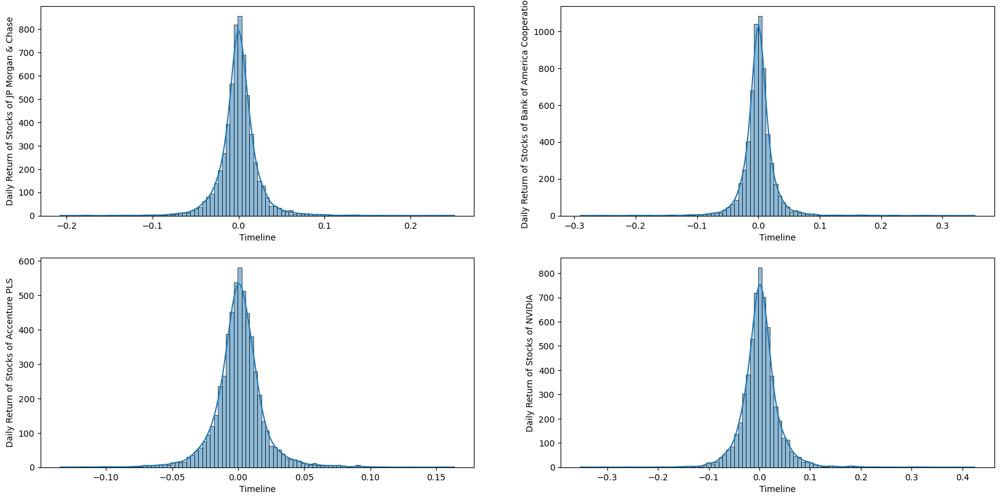

In [40]:
plt.figure(figsize=(20, 150))
plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]

for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.histplot(i['Daily Return'], bins = 100, kde = True)
    plt.ylabel(f"Daily Return of Stocks of {j}")
    plt.xlabel("Timeline")

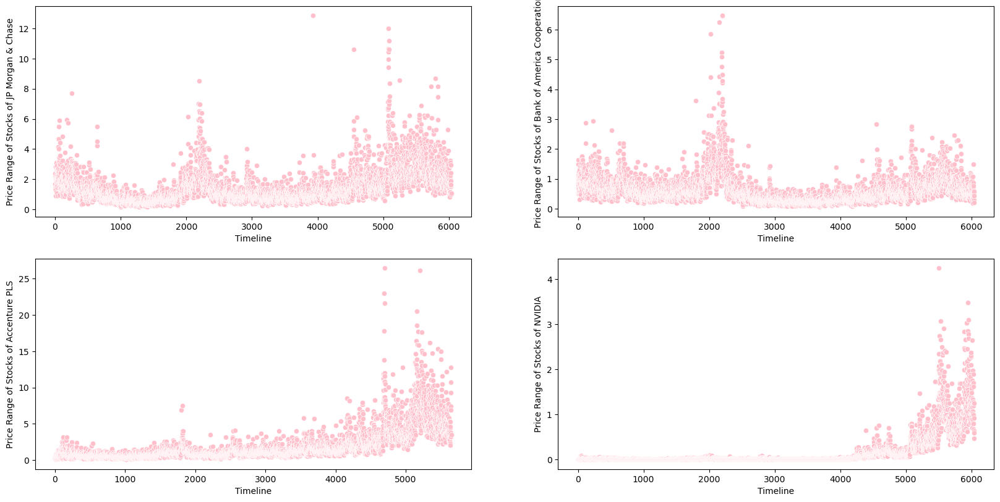

In [41]:
plt.figure(figsize=(20, 150))
plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]

for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.scatterplot(i['Price Range'], marker = 'o', color = 'pink')
    plt.ylabel(f"Price Range of Stocks of {j}")
    plt.xlabel("Timeline")

Text(0.5, 1.0, '50-day Exponential Moving Average (EMA) for Various Stocks')

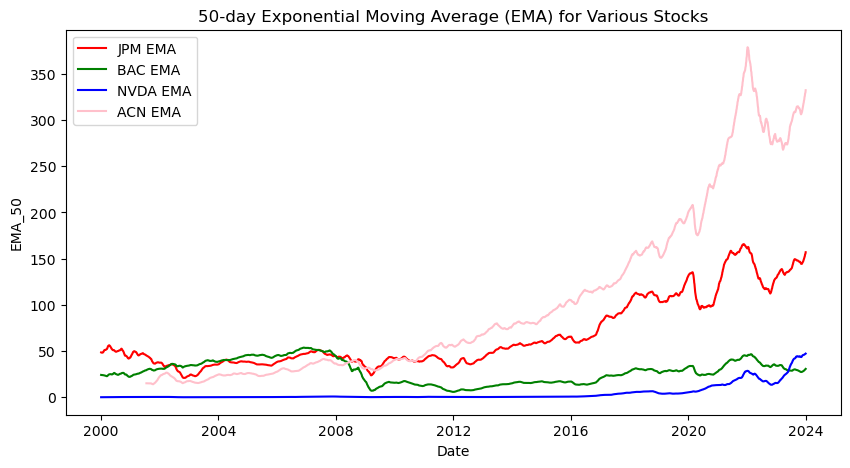

In [42]:
plt.figure(figsize = (10,5))
sns.lineplot(y = jpm_data["EMA_50"], color = 'red', x = jpm_data["Date"], label = "JPM EMA")
sns.lineplot(y = bac_data["EMA_50"], color = 'green', x = bac_data["Date"], label = "BAC EMA")
sns.lineplot(y = nvda_data["EMA_50"], color = 'blue', x = nvda_data["Date"], label = "NVDA EMA")
sns.lineplot(y = acn_data["EMA_50"], color = 'pink', x = acn_data["Date"], label = "ACN EMA")
plt.title("50-day Exponential Moving Average (EMA) for Various Stocks")

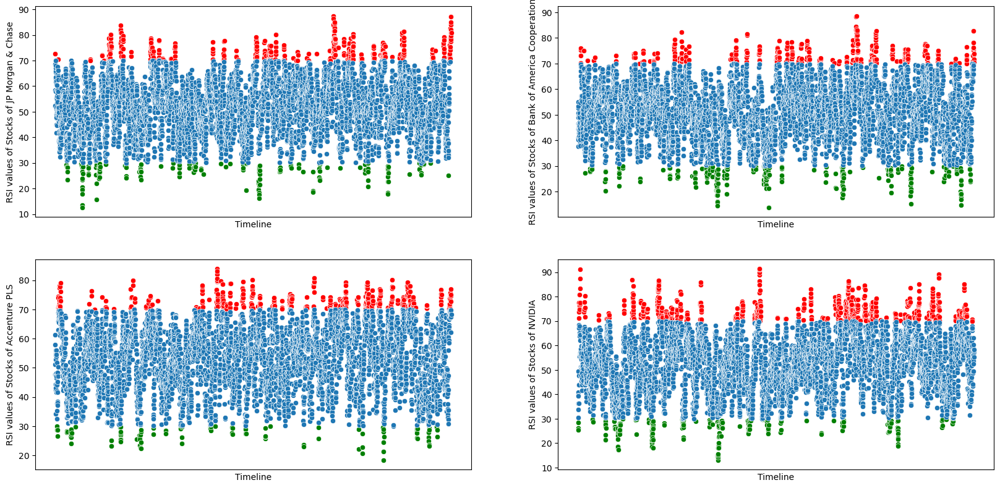

In [43]:
plt.figure(figsize=(20, 150))
ax = plt.subplots_adjust(top=1.25, bottom=1.2)
list = [1,2,3, 4]
i=0;
for i,j, k in zip(data, stock_name, list):
    plt.subplot(2,2,k)
    sns.scatterplot(i["RSI"][i["RSI"] > 70], marker = 'o', color = 'red')
    sns.scatterplot(i['RSI'][i['RSI'] < 30], marker = 'o', color = 'green')
    sns.scatterplot(i["RSI"][(i["RSI"] >= 30) & (i["RSI"] <= 70)], marker = 'o')
    plt.ylabel(f"RSI values of Stocks of {j}")
    plt.xlabel("Timeline")
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

In [44]:
jpm_data = jpm_data.drop(["Daily Return", "Date"], axis = 1)
bac_data = bac_data.drop(["Daily Return", "Date"], axis = 1)
acn_data = acn_data.drop(["Daily Return", "Date"], axis = 1)
nvda_data = nvda_data.drop(["Daily Return", "Date"], axis = 1)

In [45]:
jpm_data['RSI'] = jpm_data['RSI'].fillna(jpm_data['RSI'].mean())
bac_data['RSI'] = bac_data['RSI'].fillna(bac_data['RSI'].mean())
acn_data['RSI'] = acn_data['RSI'].fillna(acn_data['RSI'].mean())
nvda_data['RSI'] = nvda_data['RSI'].fillna(nvda_data['RSI'].mean())

In [46]:
data = [jpm_data, bac_data, acn_data, nvda_data]

In [47]:
jpm_data.head()

,Open,High,Low,Close,Adj Close,Volume,Price Range,EMA_50,RSI
0,49.833332,50.250000,48.083332,48.583332,23.645033,12019200,2.166668,48.583332,52.138861
1,47.083332,47.458332,46.125000,47.250000,23.126221,11723400,1.333332,48.531045,52.138861
2,46.833332,48.375000,46.000000,46.958332,22.983475,8714550,2.375000,48.469370,52.138861
3,46.750000,48.625000,46.500000,47.625000,23.309772,8369250,2.125000,48.436257,52.138861
4,48.416668,49.000000,47.333332,48.500000,23.738024,6571950,1.666668,48.438757,52.138861


## Transforming the Data

In [48]:
sc1 = StandardScaler()
jpm_scaled_data = sc1.fit_transform(jpm_data)

sc2 = StandardScaler()
bac_scaled_data = sc2.fit_transform(bac_data)

sc3 = StandardScaler()
acn_scaled_data = sc3.fit_transform(acn_data)

sc4 = StandardScaler()
nvda_scaled_data = sc4.fit_transform(nvda_data)

In [49]:
jpm_scaled = pd.DataFrame(jpm_scaled_data)

In [50]:
bac_scaled = pd.DataFrame(bac_scaled_data)
acn_scaled = pd.DataFrame(acn_scaled_data)
nvda_scaled = pd.DataFrame(nvda_scaled_data)

## Preparing the Testing Data

In [84]:
jpm_test = data_test["JPM"]
jpm_test["Date"] = jpm_test.index
jpm_test = jpm_test.reset_index(drop = True)

bac_test = data_test["BAC"]
bac_test["Date"] = bac_test.index
bac_test = bac_test.reset_index(drop = True)

acn_test = data_test["ACN"]
acn_test["Date"] = acn_test.index
acn_test = bac_test.reset_index(drop = True)

nvda_test = data_test["NVDA"]
nvda_test["Date"] = nvda_test.index
nvda_test = nvda_test.reset_index(drop = True)

In [85]:
test = [jpm_test, bac_test, acn_test, nvda_test]

In [86]:
for df in test:
    df["Price Range"] = df["High"] - df["Low"]
    df["EMA_50"] = df['Close'].ewm(span=50, adjust=False).mean()
    df["RSI"] = ta.momentum.RSIIndicator(df['Close']).rsi()
    df['RSI'] = df['RSI'].fillna(df['RSI'].mean())
    df = df.drop(["Date"], axis = 1)

In [87]:
jpm_test = jpm_test.drop(["Date"], axis = 1)
bac_test = bac_test.drop(["Date"], axis = 1)
acn_test = acn_test.drop(["Date"], axis = 1)
nvda_test = nvda_test.drop(["Date"], axis = 1)

In [90]:
jpm_test_scaled = sc1.transform(jpm_test)
bac_test_scaled = sc2.transform(bac_test)
acn_test_scaled = sc3.transform(acn_test)
nvda_test_scaled = sc4.transform(nvda_test)

In [91]:
jpm_test_scaled = pd.DataFrame(jpm_test_scaled)
bac_test_scaled = pd.DataFrame(bac_test_scaled)
acn_test_scaled = pd.DataFrame(acn_test_scaled)
nvda_test_scaled = pd.DataFrame(nvda_test_scaled)

## Construct Functions For Multiprocessing

In [76]:
def split_data(scaled_traindata, scaled_testdata):
    x_train = scaled_traindata.drop(columns = [scaled_traindata.columns[3]], axis = 1)
    y_train = scaled_traindata.iloc[:, 3]
    x_test = scaled_testdata.drop(columns = [scaled_testdata.columns[3]], axis = 1)
    y_test = scaled_testdata.iloc[:, 3]
    return x_train, x_test, y_train, y_test

In [92]:
jpm_x_train, jpm_x_test, jpm_y_train, jpm_y_test = split_data(jpm_scaled, jpm_test_scaled)
acn_x_train, acn_x_test, acn_y_train, acn_y_test = split_data(acn_scaled, acn_test_scaled)
bac_x_train, bac_x_test, bac_y_train, bac_y_test = split_data(bac_scaled, bac_test_scaled)
nvda_x_train, nvda_x_test, nvda_y_train, nvda_y_test = split_data(nvda_scaled, nvda_test_scaled)

In [97]:
print(len(jpm_x_test))
print(len(jpm_y_test))

154
154


In [99]:
print(len(jpm_x_train))
print(len(jpm_y_train))

6037
6037


In [100]:
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(128, activation = 'relu', input_shape = input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer = 'adam', loss = 'mse')
    return model

In [108]:
def train_ensemble_model(data_split):
    t1 = time.perf_counter()
    x_train, x_test, y_train, y_test = data_split
    input_shape = (x_train.shape[1], 1)
    x_train = np.array(x_train)
    x_test = np.array(x_test)
    x_train_lstm = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))
    x_test_lstm = x_test.reshape((x_test.shape[0], x_test.shape[1], 1))

    lstm_model = KerasRegressor(build_fn = create_lstm_model, input_shape = input_shape, epochs = 100, verbose = 0)
    lstm_model.fit(x_train_lstm, y_train)
    lstm_pred = lstm_model.predict(x_test_lstm)

    rf_model = RandomForestRegressor(n_estimators = 100, random_state = 42)
    rf_model.fit(x_train, y_train)
    rf_pred = rf_model.predict(x_test)

    combined_pred = 0.5*lstm_pred + 0.5*rf_pred

    mse = mean_squared_error(y_test, combined_pred)
    rmse = np.sqrt(mse)
    mas = mean_absolute_error(y_test, combined_pred)

    t2 = time.perf_counter()
    
    print("Mean Squared Error : ", mse)
    print("Root Mean Squared Error : ", rmse)
    print("Mean Absolute Error : ", mas)
    print(f'Process time: {(t2 - t1) / 60:0.2f} minute(s)...')
    print("-----------------------------------------------")
    print("-----------------------------------------------")
    return

In [110]:
def function_1(data):
    train_ensemble_model(data)

In [102]:
data_split = [
    (jpm_x_train, jpm_x_test, jpm_y_train, jpm_y_test),
    (bac_x_train, bac_x_test, bac_y_train, bac_y_test),
    (acn_x_train, acn_x_test, acn_y_train, acn_y_test),
    (nvda_x_train, nvda_x_test, nvda_y_train, nvda_y_test)
]

In [112]:
import time
import concurrent.futures

In [115]:
if __name__ == "__main__":
    with ProcessPoolExecutor() as executor:
        for i in range(0, len(data_split)):
            train_ensemble_model(data_split[i])

Mean Squared Error :  0.1388688562761202
Root Mean Squared Error :  0.3726511187104101
Mean Absolute Error :  0.3278319944951857
Process time: 2.69 minute(s)...
-----------------------------------------------
-----------------------------------------------
Mean Squared Error :  0.0006437776792821199
Root Mean Squared Error :  0.02537277437100878
Mean Absolute Error :  0.01945761674531621
Process time: 2.62 minute(s)...
-----------------------------------------------
-----------------------------------------------
Mean Squared Error :  0.1558021576493847
Root Mean Squared Error :  0.3947178202835346
Mean Absolute Error :  0.3893237670837086
Process time: 2.69 minute(s)...
-----------------------------------------------
-----------------------------------------------
Mean Squared Error :  21.99525820155323
Root Mean Squared Error :  4.68991025517048
Mean Absolute Error :  3.8676960327155077
Process time: 2.75 minute(s)...
-----------------------------------------------
------------------